# Ćwiczenia 1
W trakcie ćwiczeń implementowana będzie metoda przeszukiwania - Metoda gradientu prostego.
Celem ćwiczeń jest implementacja metody gradientu prostego dla dwóch funkcji oraz przebadanie wpływu rozmiaru kroku dla różnych (losowych) punktów początkowych. Należy zwizualizować proces minimalizacji na wykresie 2D.

## Punktacja:
 - obliczenie gradientów funkcji 1 pkt
 - implementacja kroku gradientu prostego 1 pkt
 - przeprowadzenie przeszukiwania minimum na obu funkcjach 1 pkt
 - wizualizacja przeszukiwania z wielu miejsc początkowych 1 pkt


In [ ]:
from typing import Callable, Tuple
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from random import uniform

Funkcje do przeszukania:
\begin{equation}
f(\textbf{x})=x_1^2+x_2^2
\end{equation}

\begin{equation}
g(x) = 1.5-\exp \left\{-x_1^2-x_2^2\right\}-0.5 \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\}
\end{equation}

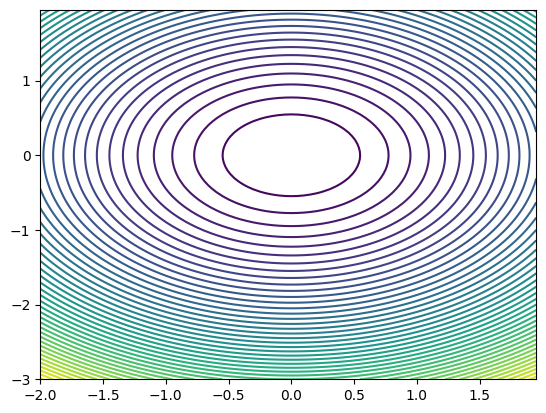

In [ ]:
# Function to analyze
X = np.arange(-2, 2, 0.05)
Y = np.arange(-3, 2, 0.05)
X, Y = np.meshgrid(X, Y)
Z = X**2 + Y**2

# Contour plot en 2D
plt.figure()
plt.contour(X, Y, Z, 50)

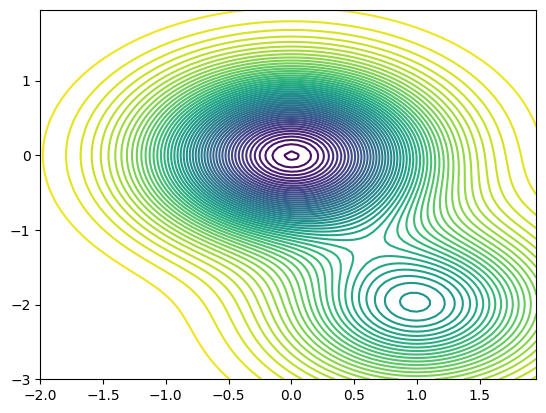

In [ ]:
X = np.arange(-2, 2, 0.05)
Y = np.arange(-3, 2, 0.05)
X, Y = np.meshgrid(X, Y)
Z =1.5-np.exp(-X**(2)-Y**(2))-0.5*np.exp(-(X-1)**(2)-(Y+2)**(2))
# Contour plot en 2D

plt.figure()
plt.contour(X, Y, Z, 50)

Gradienty funkcji
\begin{equation}
\nabla f(x)=
\begin{bmatrix}
2x_1 \\
2x_2
\end{bmatrix}
\end{equation}

\begin{equation}
\nabla g(x)=
\begin{bmatrix}
2 x_1 \exp \left\{-x_1^2-x_2^2\right\}+\left(x_1-1\right) \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\} \\
2 x_2 \exp \left\{-x_1^2-x_2^2\right\}+\left(x_2+2\right) \exp \left\{-\left(x_1-1\right)^2-\left(x_2+2\right)^2\right\}
\end{bmatrix}
\end{equation}

In [ ]:
class SimpleGradientDescent:
    X = np.arange(-2, 2, 0.05)
    Y = np.arange(-3, 2, 0.05)
    X, Y = np.meshgrid(X, Y)

    def __init__(self,
                 func: Callable[[float, float], float],
                 grad_func: Callable[[float, float], Tuple[float, float]],
                 alpha: float = 0.1):
        self.alpha = alpha
        self.func = func
        self.grad_func = grad_func
        self.trace = None  # trace of search

    def _calc_Z_value(self):
        self.Z = self.func(self.X, self.Y)

    def plot_func(self):
        self._calc_Z_value()
        plt.figure()
        plt.contour(self.X, self.Y, self.Z, 50)
        if len(self.trace) > 0:
            trace_array = np.array(self.trace)
            plt.scatter(trace_array[:, 0], trace_array[:, 1], s=10)
        # chcemy żeby pokazało nam wykres na końcu
        plt.show()

    def calculate_func_value(self, x1: float, x2: float) -> float:
        return self.func(x1, x2)

    def calculate_func_grad(self, x1: float, x2: float) -> Tuple[float, float]:
        return self.grad_func(x1, x2)

    # obliczamy nowe wartości x na podstawie wzoru : x = x - alpha * krok (obliczony gradient)
    def gradient_descent_step(self, x1: float, x2: float) -> Tuple[float, float]:
        gradient_x1, gradient_x2 = self.calculate_func_grad(x1, x2)
        new_x1 = x1 - self.alpha * gradient_x1
        new_x2 = x2 - self.alpha * gradient_x2
        return new_x1, new_x2

    def minimize(self, x1_init: float, x2_init: float, steps: int, verbose: int = 0, plot: bool = False) -> float:

        x1 = x1_init
        x2 = x2_init
        i = 0
        # inicjujemy listę, gdzie będziemy kolejne punkty (x, y)
        self.trace = []

        for i in range(steps):
            # dodajemyy putnkty do śladu
            self.trace.append((x1, x2))

            i += 1

            if verbose > 0 and i % 5 == 0:
                print(f"Krok {i} :  współrzędna x = {x1}, współrzędna y = {x2}")

            # obliczamy położenie nowych punktów
            x1, x2 = self.gradient_descent_step(x1, x2)

        if plot:
            self.plot_func()

        # zwracamy punkt, do którego ostatecznie doszliśmy
        return self.calculate_func_value(x1, x2)


# Funkcja 1

In [ ]:
# funkcja zwracająca wartość f(x, y)
def function_f(x: float, y: float) -> float:
    return x ** 2 + y ** 2


# funkcja zwracająca wartości gradientu f(x, y)
def function_f_gradient(x: float, y: float) -> tuple:
    x_derivative = 2 * x
    y_derivative = 2 * y
    return x_derivative, y_derivative



In [ ]:
F_1 = SimpleGradientDescent(function_f, function_f_gradient)

Krok 5 :  współrzędna x = 0.4096, współrzędna y = 0.0
Krok 10 :  współrzędna x = 0.13421772800000004, współrzędna y = 0.0
Krok 15 :  współrzędna x = 0.04398046511104001, współrzędna y = 0.0
Krok 20 :  współrzędna x = 0.014411518807585589, współrzędna y = 0.0
Krok 25 :  współrzędna x = 0.004722366482869646, współrzędna y = 0.0
Krok 30 :  współrzędna x = 0.0015474250491067257, współrzędna y = 0.0
Krok 35 :  współrzędna x = 0.0005070602400912919, współrzędna y = 0.0
Krok 40 :  współrzędna x = 0.00016615349947311455, współrzędna y = 0.0
Krok 45 :  współrzędna x = 5.444517870735017e-05, współrzędna y = 0.0
Krok 50 :  współrzędna x = 1.7840596158824504e-05, współrzędna y = 0.0
Krok 55 :  współrzędna x = 5.8460065493236135e-06, współrzędna y = 0.0
Krok 60 :  współrzędna x = 1.915619426082362e-06, współrzędna y = 0.0
Krok 65 :  współrzędna x = 6.277101735386684e-07, współrzędna y = 0.0
Krok 70 :  współrzędna x = 2.0568806966515085e-07, współrzędna y = 0.0
Krok 75 :  współrzędna x = 6.739986666

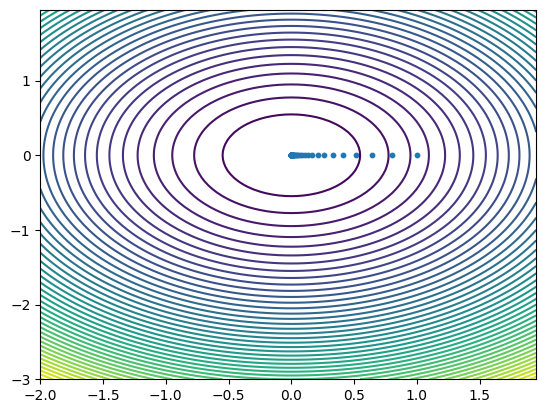

Minimum :  1.7218479456385795e-39


In [29]:
print("Minimum : ", F_1.minimize(1, 0, 200, 1, True))


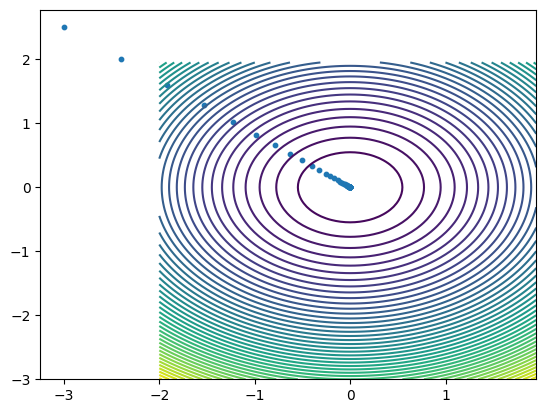

Minimum : 2.6258181170988317e-38


In [18]:
print("Minimum :", F_1.minimize(-3, 2.5, 200, 0, True))

**WNIOSKI** :Funkcja f(x) posiada jedno minimum globalne w punkcie (0, 0). Nasza funkcja zwraca wartości niezerowe zwraca jednak wartości niezerowe, jednak są to liczby tak małe, że w przybliżeniu dają nam własnie punkt (0, 0). Na początku jesteśmy oddaleni od minimum więc wartości kroku są duże. Im bliżej minimum jesteśmy tym 'kroki' stają się mniejsze, żeby z większą dokładnością trafić w minimum

In [21]:
def check_function_f_with_different_aplha():
    alpha = 0.1
    x = 1.25
    y = -0.4
    for i in range(10):
        print("Current alpha : ", alpha)
        F = SimpleGradientDescent(function_f, function_f_gradient, alpha)
        print(F.minimize(x, y, 200, 0, True))
        alpha += 0.1



Current alpha :  0.1


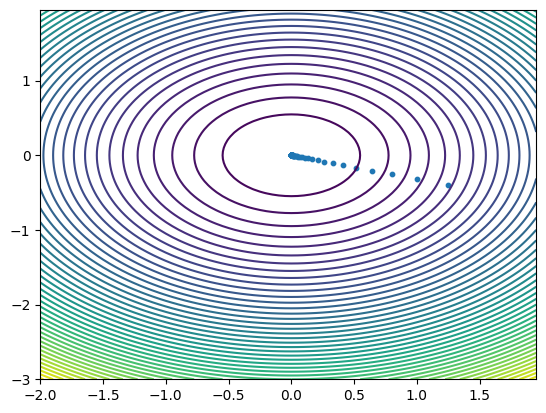

2.965883086362453e-39
Current alpha :  0.2


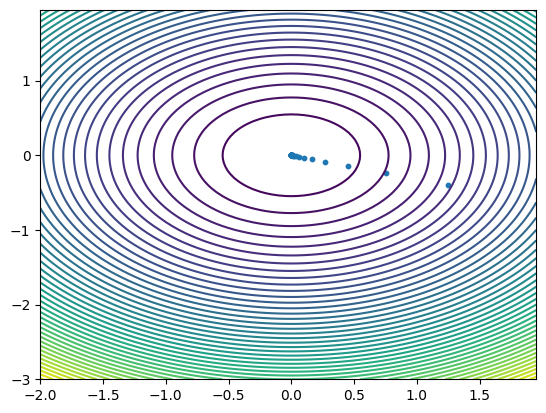

3.13804656722563e-89
Current alpha :  0.30000000000000004


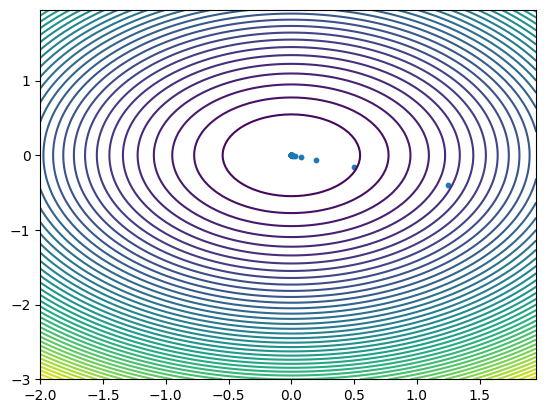

1.148565486063452e-159
Current alpha :  0.4


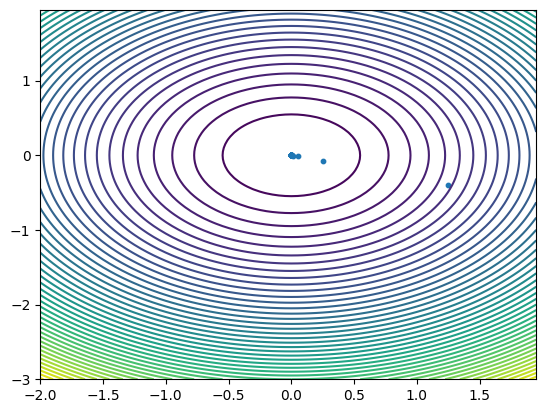

4.447925415004345e-280
Current alpha :  0.5


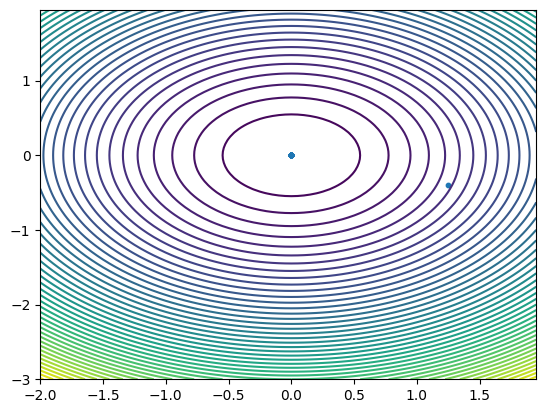

0.0
Current alpha :  0.6


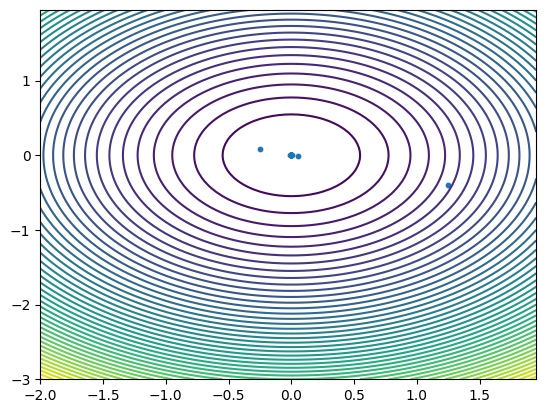

4.447925415004328e-280
Current alpha :  0.7


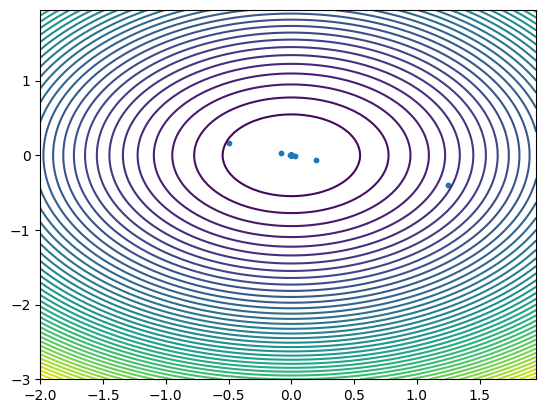

1.1485654860634612e-159
Current alpha :  0.7999999999999999


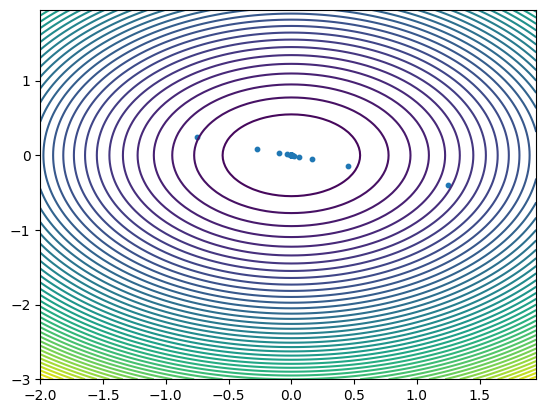

3.1380465672254055e-89
Current alpha :  0.8999999999999999


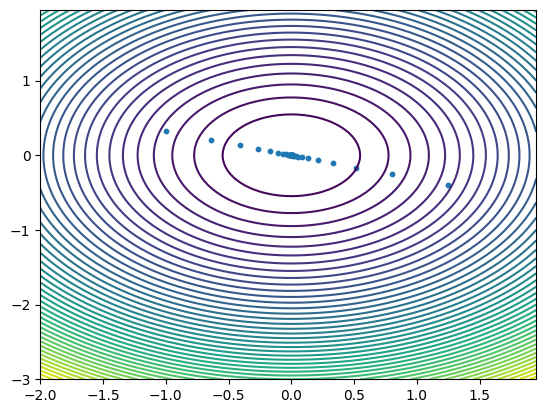

2.965883086362187e-39
Current alpha :  0.9999999999999999


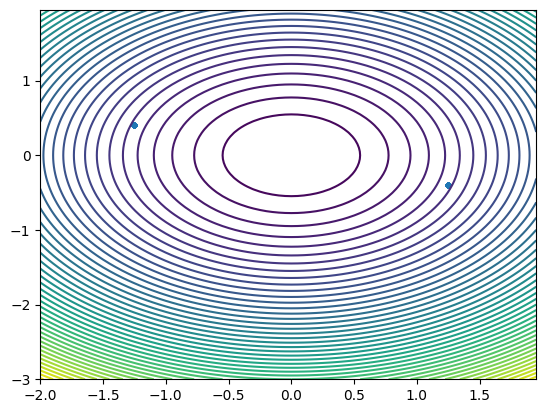

1.7224999999997603


In [22]:
check_function_f_with_different_aplha()

**WNIOSKI** : Zbyt duże alpha powoduje błędne wskazanie punktów w których funkcja osiąga minimum

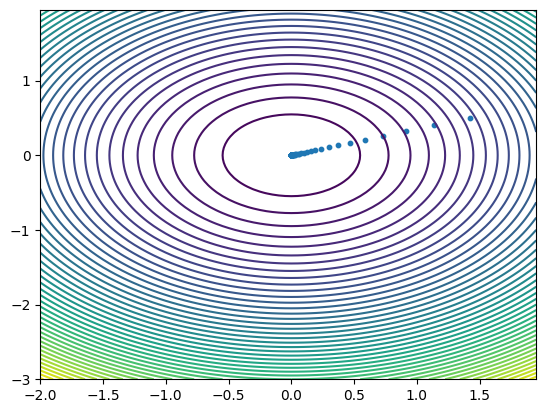

3.916988412263166e-39


In [31]:
# Badanie z losowego punktu dla funkcji F

def random_floats():
    x = uniform(-2, 2)
    y = uniform(-3, 2)
    return x, y

x, y = random_floats()

print(F_1.minimize(x, y, 200, 0, True))

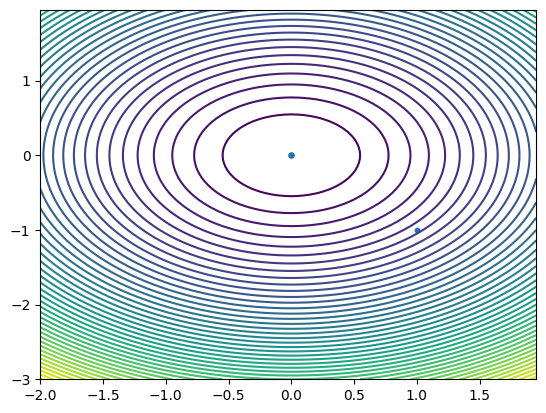

0.0


In [ ]:
F = SimpleGradientDescent(function_f, function_f_gradient, 0.5)
print(F.minimize(1, -1, 5, 0, True))

# Funkcja 2

In [25]:
# funkcja zwracająca wartość g(x, y)
def function_g(x: float, y: float) -> float:
    return 1.5-np.exp(-x**(2)-y ** (2))-0.5*np.exp(-(x-1)**(2)-(y+2)**(2))


# funkcja zwracająca gradienty g(x, y)
def function_g_gradient(x: float, y: float) -> tuple:
    x_derivative = 2*x*np.exp(-(x**2) - (y**2)) + (x - 1) * np.exp(-(x- 1)**2 - (y + 2)**2)
    y_derivative = 2*y*np.exp(-(x**2) - (y**2)) + (y + 2) * np.exp(-(x- 1)**2 - (y + 2)**2)
    return x_derivative, y_derivative

In [26]:
G_1 = SimpleGradientDescent(function_g, function_g_gradient)

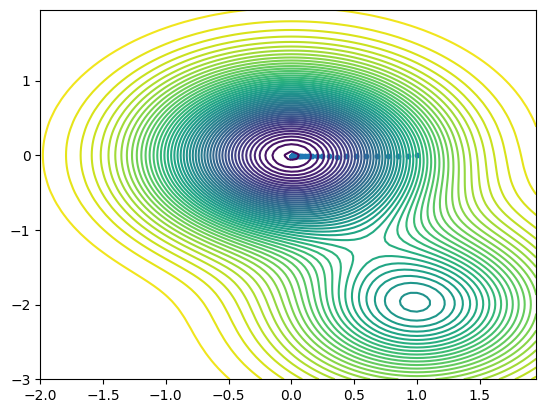

Minimum :  0.4965724836763416


In [32]:
print("Minimum : ", G_1.minimize(1, 0, 200, 0, True))

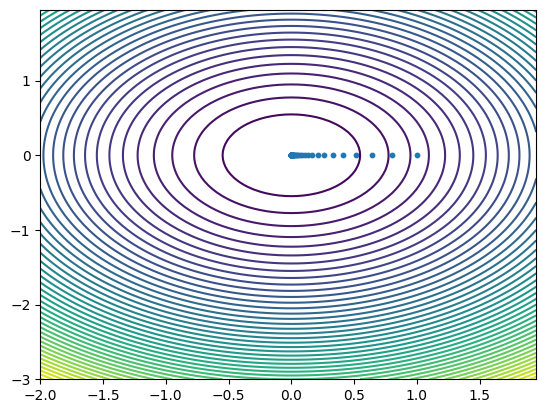

Minimum :  1.5134705823042444e-194


In [ ]:
print("Minimum : ", F_1.minimize(1, 0, 1000, 0, True))

Krok 5 :  współrzędna x = 1.3799634387655846, współrzędna y = -2.3797419904525565
Krok 10 :  współrzędna x = 1.2483278159266202, współrzędna y = -2.2474780099592544
Krok 15 :  współrzędna x = 1.1516235901167429, współrzędna y = -2.1495406460403808
Krok 20 :  współrzędna x = 1.0880799321783619, współrzędna y = -2.0841860458771357
Krok 25 :  współrzędna x = 1.0483338738485688, współrzędna y = -2.0423384934144524
Krok 30 :  współrzędna x = 1.0238623524661168, współrzędna y = -2.0157962370364975
Krok 35 :  współrzędna x = 1.0088319335898417, współrzędna y = -1.9989375749732952
Krok 40 :  współrzędna x = 0.9995824231041488, współrzędna y = -1.9881903672533718
Krok 45 :  współrzędna x = 0.993873501935779, współrzędna y = -1.9813174472069137
Krok 50 :  współrzędna x = 0.9903395786273477, współrzędna y = -1.9769127747211828
Krok 55 :  współrzędna x = 0.9881463359187957, współrzędna y = -1.9740864644717968
Krok 60 :  współrzędna x = 0.9867820857748631, współrzędna y = -1.9722718827044587
Krok 6

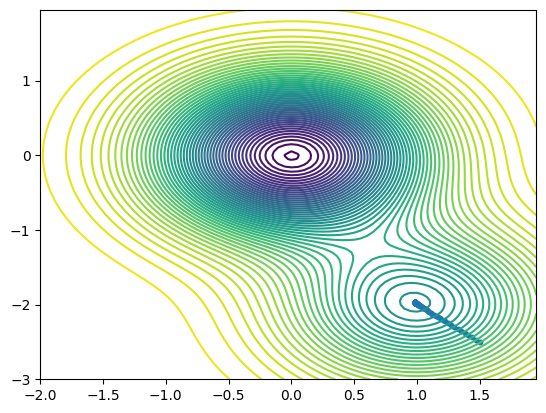

Minimum jest w punkcie (x, y) :  (0.9845100671308792, -1.969020133898084)


In [ ]:
print("Minimum jest w punkcie (x, y) : ", G_1.minimize(1.5, -2.5, 200, 1, True))

**WNIOSKI** : Jak widać na zamieszczonych wykresach do funkcji g(x), posiada ona dwa minima. I w zależności od wyboru punktu, nasza minimalizacja zwróci jedno z nich,a dokładnie te będące bliżej. W pierwszym przykładzie funkcji g(x), widzimy, że zwiększenie ilości kroków zwraca punkt w którym jest minimum z większą precyzją

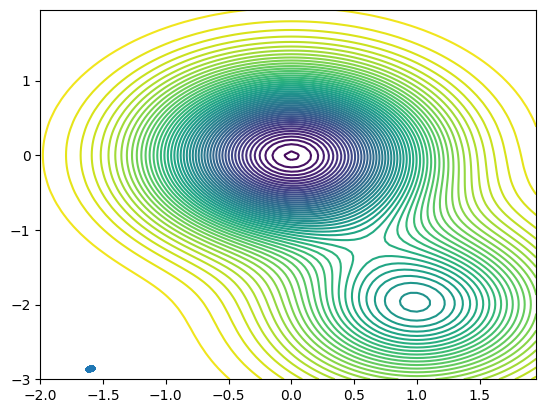

1.4996744929223598


In [35]:
# Badanie z losowego punktu dla funkcji G

def random_floats():
    x = uniform(-2, 2)
    y = uniform(-3, 2)
    return x, y

x, y = random_floats()

print(G_1.minimize(x, y, 200, 0, True))

In [ ]:
def check_funciton_with_different_aplha():
    alpha = 0.1
    x = 1.25
    y = -0.4
    for i in range(9):
        print("Current alpha : ", alpha)
        G = SimpleGradientDescent(function_g, function_g_gradient, alpha)
        print(G.minimize(x, y, 200, 0, True))
        alpha += 0.1


Current alpha :  0.1


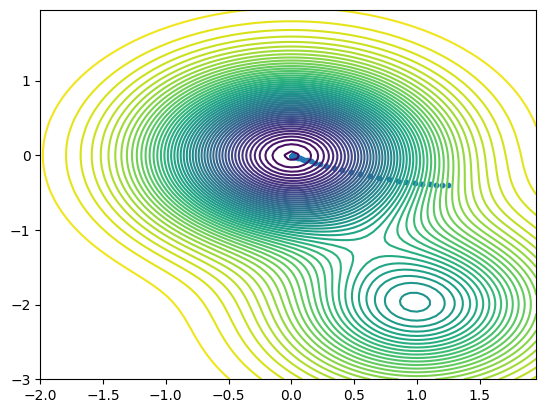

0.4965724836763416
Current alpha :  0.2


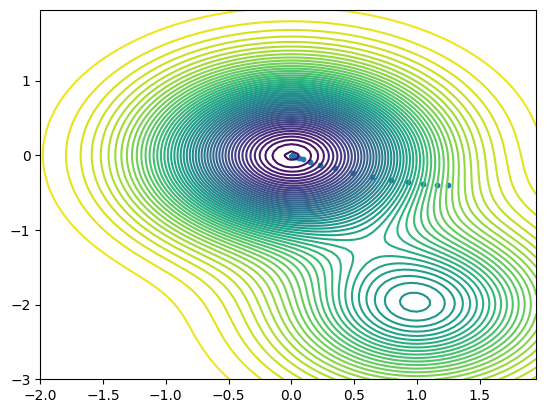

0.4965724836763416
Current alpha :  0.30000000000000004


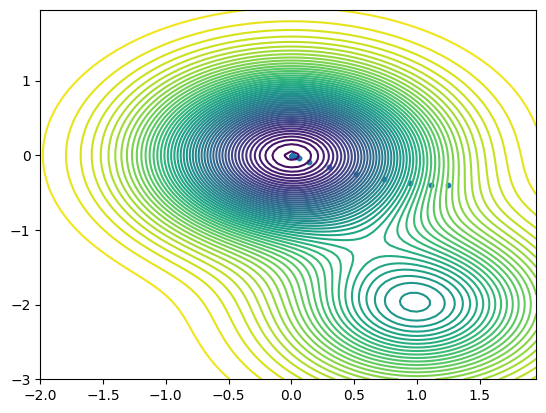

0.4965724836763416
Current alpha :  0.4


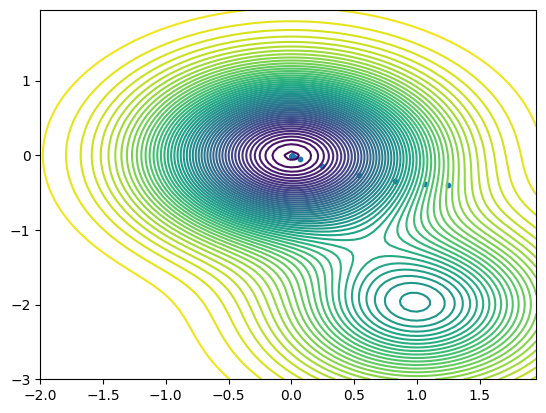

0.4965724836763416
Current alpha :  0.5


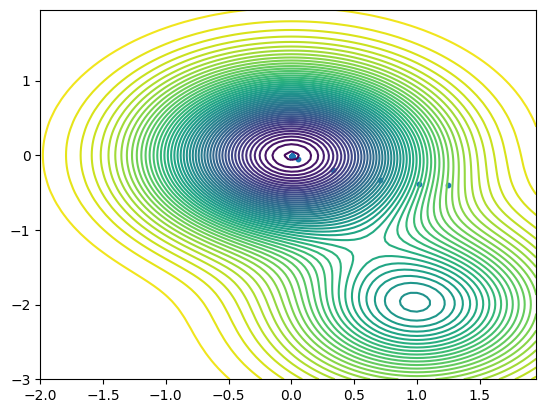

0.4965724836763416
Current alpha :  0.6


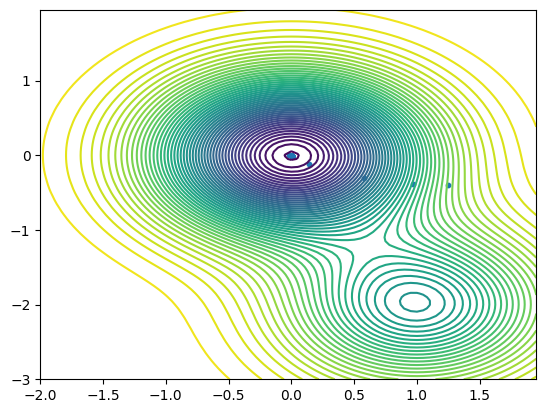

0.4965724836763416
Current alpha :  0.7


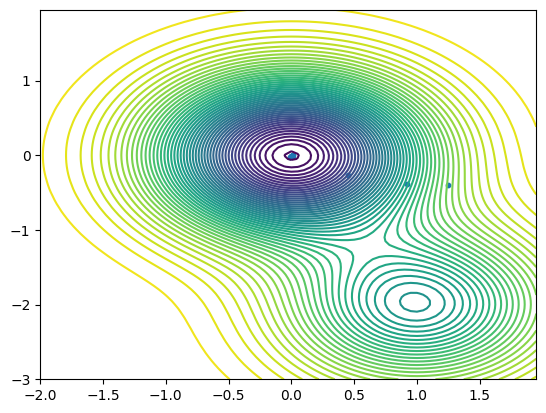

0.4965724836763416
Current alpha :  0.7999999999999999


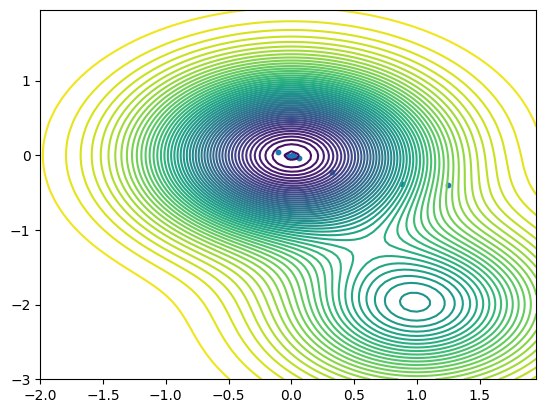

0.4965724836763416
Current alpha :  0.8999999999999999


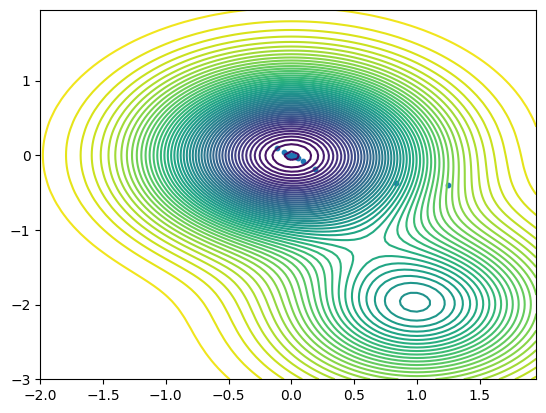

0.4965724836763416


In [ ]:
check_funciton_with_different_aplha()

**WNIOSKI :** Przy zwiększaniu alpha widzimy, że dla większych wartości zaczynają się pojawiać większe rozbieżności. A przy zbyt dużych wartościach minimum jest przeskakiwane i kolejke kroki zawracają w stronę minimum